<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ вакансий на hh.ru
   

In [336]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from numpy import NaN

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [337]:
ds = pd.read_csv('data/dst-3.0_16_1_hh_database.csv', sep=';')
display(ds.shape) # Задание 2.1 Чему равна размерность таблицы? Введите её в виде кортежа (число строк, число столбцов).

(44744, 12)

2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [338]:
display(ds.head())
display(ds.tail())

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

In [339]:
display(ds.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

4. Обратите внимание на информацию о числе непустых значений.

In [340]:
# Задание 2.4
# Выберите все признаки, в которых есть пропуски в данных

null_in_cols = ds.isnull().mean() * 100    # доля пропусков по всем столбцам
cols_with_nulls = null_in_cols[null_in_cols > 0]    # фильтр по столбцам, где толя пропусков > 0

display(cols_with_nulls)

Опыт работы                        0.375469
Последнее/нынешнее место работы    0.002235
Последняя/нынешняя должность       0.004470
dtype: float64

5. Выведите основную статистическую информацию о столбцах.


In [341]:
# Задание 2.5
ds.describe()

# Сколько уникальных значений содержится в столбце «Опыт работы»?
display(ds['Опыт работы'].nunique())

# Какая из искомых должностей самая распространённая?
display(ds['Ищет работу на должность:'].mode())

44413

0    Системный администратор
Name: Ищет работу на должность:, dtype: object

# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [342]:
def detect_education(str_education):
    '''
    Функция определения уровня образования по текстовому описанию признака.
    :param str_education: текстовое описание признака.
    :return: уровень образования
    '''
    words = str_education.split(' ') # режем строку по пробелам на список слов

    if words[0] == 'Высшее':
        return 'высшее'
    elif words[0] == 'Неоконченное':
        return 'неоконченное высшее'
    elif words[1] == 'специальное':
        return 'среднее специальное'
    elif words[0] == 'Среднее':
        return 'среднее'

ds['Образование'] = ds['Образование и ВУЗ'].apply(detect_education) # формируем новый признак "образование"

display(ds['Образование'].nunique()) # проверка, 4 значения

ds.drop(['Образование и ВУЗ'], axis=1, inplace=True) # убираем старый признак

display(ds.head())

# Задание 3.1
# Сколько соискателей имеет средний уровень образования (школьное образование)?
ds[ds['Образование'] == 'среднее'].shape[0]

4

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,08.04.2019 14:23,Не указано,высшее
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,22.04.2019 10:32,Не указано,высшее


559

2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [343]:
def detect_gender(str_data):
    '''
    Функция определения пола по тестовому описанию признака.
    :param str_data: текстовое описание признака.
    :return: М или Ж
    '''
    words = str_data.split(' ') # разрезаем строку описания на список слов

    if words[0] == 'Мужчина':
        return 'М'
    elif words[0] == 'Женщина':
        return 'Ж'

def detect_age(str_data):
    '''
    Функция определения возраста по тестовому описанию признака.
    :param str_data: текстовое описание признака.
    :return: возраст в формате целого числа
    '''
    sub_data = str_data.split(' , ')  # разбиваем текстовое описание признаков на список
    return int(sub_data[1][1:4]) # выводим только целое число в нужнолм формате

ds['Пол'] = ds['Пол, возраст'].apply(detect_gender) # формируем новый признак "пол"
ds['Возраст'] = ds['Пол, возраст'].apply(detect_age)    # формируем новый признак "возраст"

ds.drop(['Пол, возраст'], axis=1, inplace=True) # убираем старый признак

display(ds.head())

# Задание 3.2
# Сколько процентов женских резюме представлено в наших данных? Ответ округлите до сотых.
display(round(ds['Пол'].value_counts(normalize=True), 4)['Ж'] * 100)

# Чему равен средний возраст соискателей? Ответ округлите до десятых.
display(round(ds['Возраст'].mean(), 1))

,ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст
0,29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее,М,39
1,40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее,М,60
2,20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное,Ж,36
3,100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,08.04.2019 14:23,Не указано,высшее,М,38
4,140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,22.04.2019 10:32,Не указано,высшее,Ж,26


19.07

32.2

3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [344]:
def calc_experience(str_data):
    '''
    Функция подсчета опыта работы в месяцах на основании тестового описания признака.
    :param str_data: текстовое описание признака.
    :return: опыт работы в месяцах или np.NaN
    '''

    if str_data is np.nan or str_data.lower() == 'не указано':  # если данных нет, то возращаем NaN
        return NaN

    year_words  = ['год',   'года',   'лет']     # список слов, "описывающих" года
    month_words = ['месяц', 'месяца', 'месяцев'] # списаок слово "описывающих" месяца

    words = str_data.split(' ')[:7] # разделяем строку на слова по пробелу и отбрасываем лишнюю информацию

    years = 0  # количество лет
    months = 0 # количество месяцев

    for index, item in enumerate (words): # перебираем слова
        if item in year_words: # если нашил упоминания о "годах", то сохраняем количество лет
            years = int(words[index-1])
        if item in month_words: # если нашли упоминание о месяцах, то сохраняем количество месяцев
            months = int(words[index-1])
    # складываем, умножаем и возвращаем
    return int(years * 12 + months)

ds['Опыт работы (месяц)'] = ds['Опыт работы'].apply(calc_experience) # формируем новый признак "опыт работы"

ds = ds.drop('Опыт работы', axis=1) # убираем старый признак

display(ds.head())

# Задание 3.3
# Чему равен медианный опыт работы (в месяцах)?
display(round(ds['Опыт работы (месяц)'].median()))

,ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц)
0,29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...","МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее,М,39,202.0
1,40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее,М,60,233.0
2,20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное,Ж,36,123.0
3,100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",OpenSoft,Инженер-программист,08.04.2019 14:23,Не указано,высшее,М,38,225.0
4,140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Мармелад,Менеджер по продажам,22.04.2019 10:32,Не указано,высшее,Ж,26,67.0


100

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [345]:
def detect_city(str_data):
    '''
    Функция определения города по текстовому описанию признака.
    :param str_data: текстовое описание признака.
    :return: город (Москва, Санкт-Петербург, город-миллионник или другие
    '''
    million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород',
                      'Казань', 'Челябинск','Омск', 'Самара',
                      'Ростов-на-Дону', 'Уфа', 'Красноярск',
                      'Пермь', 'Воронеж','Волгоград']

    city = str_data.split(' , ')[0] # режем описание на слова и берем первый элемент

    if city == 'Москва':
        return 'Москва'
    elif city == 'Санкт-Петербург':
        return 'Санкт-Петербург'
    elif city in million_cities:
        return 'город-миллионник'
    else:
        return 'другие'

def detect_ready_to_move(str_data):
    '''
    Функция определения готовности к переезду по текстовому описанию признака.
    :param str_data: текстовое описание признака.
    :return: True или False
    '''
    if ('не готов к переезду' in str_data) or ('не готова к переезду' in str_data):
        return False
    elif 'хочу' in str_data:
        return True
    else:
        return True

def detect_ready_for_bisiness_trips(str_data):
    '''
    Функция определения готовности к коммадеровкам на основании текстового описания признака.
    :param str_data: текстовое описание признака.
    :return: True или False
    '''
    if 'командировка' in str_data: # если есть что анализировать
        if ('не готова к командировкам' in str_data) or ('не готов к командировкам' in str_data):
            return False
        else:

            return True
    else: # если нет информации о командировках, то стразу False
        return False

ds['Город'] = ds['Город, переезд, командировки'].apply(detect_city) # формируем новый признак "город"
ds['Готовность к переезду'] = ds['Город, переезд, командировки'].apply(detect_ready_to_move) # формируем новый признка "Готовность к переезду"
ds['Готовность к командировкам'] = ds['Город, переезд, командировки'].apply(detect_ready_for_bisiness_trips) # формируем новый признак "Готовность к командировкам"

ds = ds.drop('Город, переезд, командировки', axis=1) # убираем старый признак

display(ds.head())

# Задание 3.4
# Сколько процентов соискателей живут в Санкт-Петербурге? Ответ округлите до целого
display(round(ds['Город'].value_counts(normalize=True)['Санкт-Петербург'] * 100))

# Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? Ответ округлите до целого
display(round(ds[(ds['Готовность к переезду']) & (ds['Готовность к командировкам'])].shape[0] / ds.shape[0] * 100))

,ЗП,Ищет работу на должность:,Занятость,График,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,Готовность к переезду,Готовность к командировкам
0,29000 руб.,Системный администратор,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...","МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее,М,39,202.0,другие,False,False
1,40000 руб.,Технический писатель,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее,М,60,233.0,другие,False,True
2,20000 руб.,Оператор,полная занятость,полный день,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное,Ж,36,123.0,другие,False,False
3,100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",OpenSoft,Инженер-программист,08.04.2019 14:23,Не указано,высшее,М,38,225.0,другие,False,True
4,140000 руб.,Региональный менеджер по продажам,полная занятость,полный день,Мармелад,Менеджер по продажам,22.04.2019 10:32,Не указано,высшее,Ж,26,67.0,Москва,False,True


11

32

5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [346]:
employments = ['полная занятость', 'частичная занятость', 'проектная работа', 'волонтерство',     'стажировка']
schedules   = ['полный день',      'сменный график',      'гибкий график',    'удаленная работа', 'вахтовый метод']

# т.к. размерность массивов с занятостью и графиком одинаковая, то можно упаковать их в один объект
# и создать все признаки-мигалки за один проход
for employment, schedule in zip (employments, schedules):
    # признак создается по текстовому описанию из списков
    ds[employment] = ds['Занятость'].apply(lambda x: employment in x)
    ds[schedule]   = ds['График'].apply(lambda x: schedule in x)

ds = ds.drop(['Занятость', 'График'], axis=1) # убираем старые признаки

display(ds.head())

# Задание 3.5
# Сколько людей ищут проектную работу и волонтёрство (в обоих столбцах стоит True)?
display(ds[ds['проектная работа'] & ds['волонтерство']].shape[0])

# Сколько людей хотят работать вахтовым методом и с гибким графиком (в обоих столбцах стоит True)?
display(ds[ds['вахтовый метод'] & ds['гибкий график']].shape[0])

,ЗП,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),...,полная занятость,полный день,частичная занятость,сменный график,проектная работа,гибкий график,волонтерство,удаленная работа,стажировка,вахтовый метод
0,29000 руб.,Системный администратор,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,неоконченное высшее,М,39,202.0,...,True,True,True,True,True,True,False,True,False,True
1,40000 руб.,Технический писатель,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,высшее,М,60,233.0,...,True,True,True,True,True,True,False,True,False,False
2,20000 руб.,Оператор,ПАО Сбербанк,Кассир-операционист,16.04.2019 08:35,Не указано,среднее специальное,Ж,36,123.0,...,True,True,False,False,False,False,False,False,False,False
3,100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,OpenSoft,Инженер-программист,08.04.2019 14:23,Не указано,высшее,М,38,225.0,...,True,False,True,False,True,True,False,True,False,False
4,140000 руб.,Региональный менеджер по продажам,Мармелад,Менеджер по продажам,22.04.2019 10:32,Не указано,высшее,Ж,26,67.0,...,True,True,False,False,False,False,False,False,False,False


436

2311

6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [347]:
# подготовка длянных с валютами
ds_exchange = pd.read_csv('data/ExchangeRates.csv', sep=',') # загружаем данные с курсами валют
ds_exchange = ds_exchange.drop(['per', 'time', 'vol'], axis=1) # убираем лишние признаки

# дату переведем в формат даты
ds_exchange['date'] = pd.to_datetime(ds_exchange['date'], dayfirst=True).dt.date

display(ds_exchange.head())

display(ds_exchange['currency'].unique())

,currency,date,close,proportion
0,USD,2017-12-29,57.6291,1
1,USD,2017-12-30,57.6002,1
2,USD,2017-12-31,57.6002,1
3,USD,2018-01-01,57.6002,1
4,USD,2018-01-02,57.6002,1


array(['USD', 'EUR', 'KZT', 'KGS', 'BYN', 'UAH', 'UZS', 'AZN'],
      dtype=object)

In [348]:
ds['Обновление резюме'] = pd.to_datetime(ds['Обновление резюме'], dayfirst=True).dt.date
ds['Сумма зарплаты'] = ds['ЗП'].apply(lambda x: float(x.split(' ')[0])) # добавляем признак с суммой зарплаты
ds['Валюта зарплаты'] = ds['ЗП'].apply(lambda x: x.split(' ')[1]) # добавляем признак с валютой зарплаты в формате HH

currencyHH_to_ISO = {
    'руб.': 'RUB',
    'грн.': 'UAH',
    'бел.руб.': 'BYN',
    'сум': 'UZS'
}

ds['Валюта зарплаты'] = ds['Валюта зарплаты'].apply(lambda x: currencyHH_to_ISO.get(x, x)) # преводим наименование валюты из формата HH в ISO формат

# созадем ds на основании данных hh и обменного курса
ds_merged = ds.merge(
    ds_exchange,
    left_on=['Обновление резюме', 'Валюта зарплаты'], # признаки по которым связываем с левой стороны
    right_on=['date', 'currency'], # признаки по которым связываем с правой стороны
    how='left' # тип связывания - слева, т.е. включаются все данные с левого набора данных
)

# пропуски закрываем "1"
ds_merged['close'] = ds_merged['close'].fillna(1)
ds_merged['proportion'] = ds_merged['proportion'].fillna(1)

# display(ds_merged.info())

ds['ЗП (руб)'] = (ds_merged['Сумма зарплаты'] * ds_merged['close'] / ds_merged['proportion']).astype('int64') # создаем новый признак "ЗП (руб)" на основании расчета

ds = ds.drop(['ЗП', 'Сумма зарплаты', 'Валюта зарплаты'], axis=1)

display(ds.head())

# Задание 3.6
# Чему равна желаемая медианная заработная плата соискателей в нашей таблице (в рублях)?
display(round(ds['ЗП (руб)'].median() / 1000))

,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,полный день,частичная занятость,сменный график,проектная работа,гибкий график,волонтерство,удаленная работа,стажировка,вахтовый метод,ЗП (руб)
0,Системный администратор,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,2019-04-16,Имеется собственный автомобиль,неоконченное высшее,М,39,202.0,другие,...,True,True,True,True,True,False,True,False,True,29000
1,Технический писатель,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",2019-04-12,Не указано,высшее,М,60,233.0,другие,...,True,True,True,True,True,False,True,False,False,40000
2,Оператор,ПАО Сбербанк,Кассир-операционист,2019-04-16,Не указано,среднее специальное,Ж,36,123.0,другие,...,True,False,False,False,False,False,False,False,False,20000
3,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,OpenSoft,Инженер-программист,2019-04-08,Не указано,высшее,М,38,225.0,другие,...,False,True,False,True,True,False,True,False,False,100000
4,Региональный менеджер по продажам,Мармелад,Менеджер по продажам,2019-04-22,Не указано,высшее,Ж,26,67.0,Москва,...,True,False,False,False,False,False,False,False,False,140000


59

# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [349]:
g = px.histogram( # гистограмма
    data_frame=ds,
    x='Возраст',    # признак по оси x
    title='Распределние возраста',
    marginal='box'  # добавление коробчатой диаграммы
)
g.show()

## Вывод 1.
Мода распределения - 30 лет (2834 значения). Предельные значения - 14 и 100 лет. Возраст большинства соискателей - от 27 до 36 лет. Аномальные значения присутствуют: 100 лет и 14 лет. 14 лет можно отнести к аномалии т.к. в соответствии с трудовым законодательствои РФ минимальный возраст заключения трудового договора составляет 15 лет. Выбросы в интервале от 50-73 в принципе возможны, но все же стоит перепроверить данные, особенно в интервале 65+.

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [350]:
g = px.histogram( # гисторгамма
    data_frame=ds,
    x='Опыт работы (месяц)', # признак по оси х
    title='Распределние опыта работы (в месяцах)',
    marginal='box' # добавление коробчатой диаграммы
)
g.show()

## Вывод 2.
Мода распределения признака 80-84 мес.
Минимальное значение признака 1 месяц, максимальное 1188 месяцев.
Опыт большинства соискателей находится примерно в интервале от 1 до 154 месяцев.
Аномалии: 1188 месяцев, что составляет 99 лет опыта.

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака ЗП? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [351]:
g = px.histogram( # гистограмма
    data_frame=ds,
    x='ЗП (руб)', # признак по оси x
    title='Распределние желаемой зарплаты (в рублях)',
    marginal='box' # добавление коробчатой диаграммы
)
g.show()

## Вывод 3.
Мода распределения признака 50 тыс. - 55 тыс. руб.
Предельные значения признака: минимальное значение признака 1 руб., максимальное более 24 млн. руб.
ЗП большинства соискателей находится в интервале от 37 тыс. руб. до 95 тыс. руб.
Аномалии: ЗП более 24 млн. руб., значения в интервале от 1 до 7.7 млн. руб., а так же значения в интервале от 185 тыс. до 1 млн. руб. требуют дополнительной проверки.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [352]:
# Ограничиваем ЗП до 1млн, группировка по уровню образования
sub_ds = ds[ds['ЗП (руб)'] < 1_000_000].groupby(by=['Образование'], as_index=False).median()

g = px.bar( # столбчатая диаграммя
    data_frame=sub_ds,
    x='Образование', # значение по оси x
    y='ЗП (руб)',    # значение по оси y
    title='Зависимость медианной желаемой заработной платы от уровня образования'
)
g.show()

## Вывод 4.

У соискателей из категории "высшее" и "неоконченное высшее" наблюдаются наибольший уровень желаемой заработной платы в диапазоне от 50 до 60 тыс. руб.
У соискателей из категории "среднее" и "среднее специальное" наблюдаются наименьший уровень желаемой заработной в районе 40 тыс. руб.
Можно сказать, что уровень ожидаемой заработнойплаты напрямую зависит от образования соискателя.

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [353]:
# Ограничиваем ЗП до 1млн
sub_ds = ds[ds['ЗП (руб)'] < 1000000]

g = px.box( # коробчатая диаграмма
    data_frame=sub_ds,
    x='Город',    # значение по оси x
    y='ЗП (руб)', # значение по оси y
    color='Город', # признак для выделения цветом
    title='Зависимость желаемой заработной платы от города'
)
g.show()

## Вывод 5.
Наибольший медианный уровень желаемой заработной платы - в Москве (85 тыс. руб.), затем Санкт-Петербург (60 тыс. руб.), минимальный - в городах-миллионниках и других городах (40 тыс. руб.).
Максимальный размах уровня желаемой зарплаты наблюдается так же в Москве (60-150 тыс. руб.), на втором месте Санкт-Петербург (45-85 тыс. руб.), в городах-миллионниках и других городах минимальный размах 30-60 тыс. руб.
Признак города при распределении желаемой зарплаты играет роль только в случае с Москвой и Санкт-Петербургом.

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

In [354]:
sub_ds = ds.groupby(by=['Готовность к переезду', 'Готовность к командировкам'], as_index=False)['ЗП (руб)'].median()

g = px.bar( # столбчатая диаграмма
    data_frame=sub_ds,
    x='ЗП (руб)',              # значение по оси x
    y='Готовность к переезду', # значение по оси y
    barmode="group",           # уровни
    color='Готовность к командировкам', # цвет
    title='Зависимость медианной желаемой зарплаты от готовности к переезду и командировкам'
)
g.show()

## Вывод 6.
В группе "Готовность к перезду" медианный уровень заработной платы выше у тех, кто готов к перезду.
В группе "Готовность к командировкам" медианный уровень заработной платы выше у тех, кто готов к командировкам.
Желаемая медианная заработная плата соискателей готовых к переезду и коммандировкам равно 66 тыс. руб.
Можно сделать вывод, что готовность к переезду повышает уровень зарплаты не на много, а вот готовность к командировкам существенно увеличивает уровень заработной платы.

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [355]:
heatmap_data = pd.pivot_table( # сводная таблица
    data=ds,
    values='ЗП (руб)',   # признак, по которому собираются сводные данные
    index='Образование', # строки новой таблицы
    columns='Возраст',   # столбцы новой таблицы
    aggfunc='median',    # функция, применяемая к значениям
    fill_value=0         # значение для пропусков
)

g = px.imshow(heatmap_data) # тепловая карта
g.show()

## Вывод 7.
Максимальный уровень желаемой зарплаты (100-120 тыс.руб.) наблюдается в группе претендентов 14 и 69 лет с высшим образованием, 58 лет с неоконченным высшим образованием, 67 лет со средним специальным образованием и 56 лет со средним образованием. Значения в группе 14-17 лет можно считать неправдоподобными и не достоверными.

Минимальный уровень желаемой зарплаты наблюдается у претендентов в возрасте 22 лет во всех категориях образования.

В группе претендентов с высшим обазованием наблюдается рост уровня зарплаты с возрастом (от 30 тыс.руб. в 18 лет до 75 тысю руб. к 37 годам), достижение пика к 38-48 годам (80-90 тыс.руб.) и дальше небольшое снижение уровня ( 70-60 тыс.руб.).

Люди с высшим образованием по мере накопления опыта претендуют на более высокие зарплаты.

У людей с неоконченным высшим образованием идентичная картина, но с чуть меньшим уровнем зарплат.

Претенденты со средним специальным образованием во всех возрастных группах претендуют на примерно одинаковый уровень зарплаты (30-40 тыс.руб.). Что говорит о том, что люди работают в сфере, где отсутствует динамический рост заработной платы, скорее всего это бюджетная сфера.

Уровень зарплат в группе людей со средним образованием очень неоднороден.

Есть одно отклонение в возрастной категории, соискатель указал возраст 100 лет.

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

Text(0.5, 1.0, 'Зависимость опыта работы от возраста')

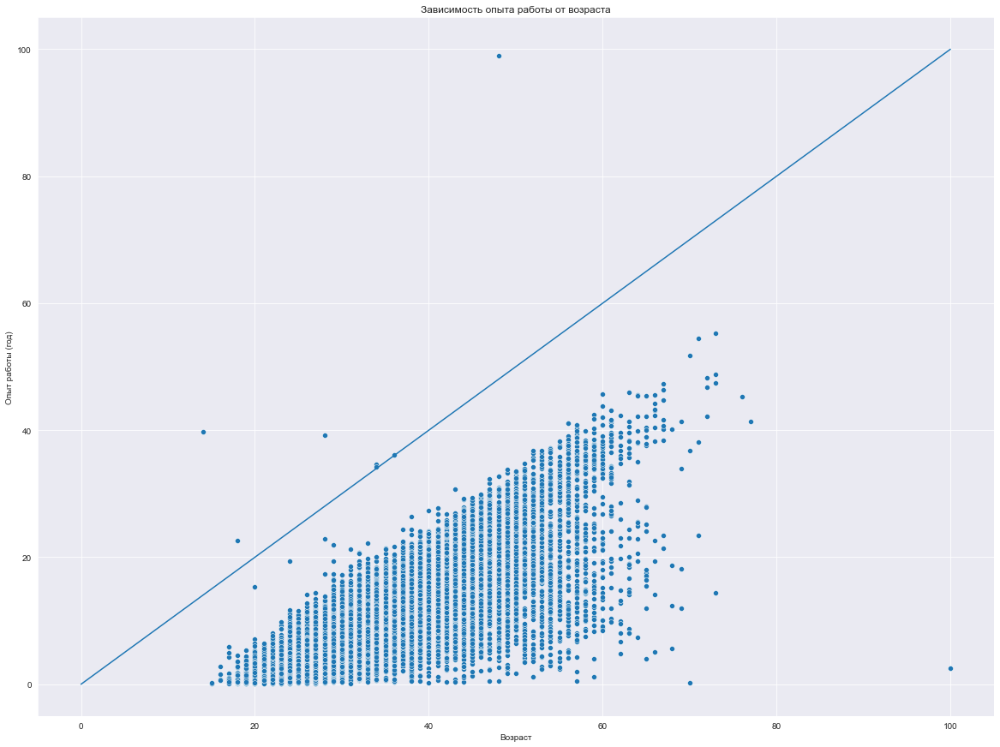

In [356]:
fig = plt.figure(figsize=(20, 15))

sub_ds = ds.copy()
sub_ds['Опыт работы (год)'] = sub_ds['Опыт работы (месяц)'] / 12

sns.lineplot(x=[0, 100], y=[0, 100])

g = sns.scatterplot( # диаграмма рассеяния
    data=sub_ds,
    x='Возраст',           # признак по оси x
    y='Опыт работы (год)', # признак по оси y
)
g.set_title('Зависимость опыта работы от возраста')

## Вывод 8.
Выше контрольной прямой лежат 4 значения, еще 3 на прямой, это аномалии.

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


Затроним прос гендера.

Посмотрим зависимость средней желаемой зарплаты от пола и образования.

In [357]:
# группировка по полу и образованию, берем среднюю по зп
sub_ds = ds.groupby(by=['Пол', 'Образование'], as_index=False)['ЗП (руб)'].mean()

g = px.bar( # столбчатая диаграмма
    data_frame=sub_ds,
    x='ЗП (руб)',    # значение по оси x
    y='Образование', # значение по оси y
    barmode="group", # уровень
    color='Пол',     # цвет
    title='Зависимость средней желаемой зарплаты от пола и образования'
)
g.show()

## Вывод А
Средняя зарплата женщин ниже, чем у мужчин, и эта картина наблюдается во всех группах образования.
Если сранивать греппы между собой, то видно, что в среднем разница в зарпалатах составлет 30%: в группе высшего образования составляет 26%, неоконченное высшее 30%, среднеспециальное 29 и среднее 30%.

Теперь затроним еще один гендерный вопрос. Как зависит уровень желаемой зарплаты от опыта работы среди мужчин и женщин с опытом работы до 20 лет?

In [358]:
sub_ds = ds.copy()
sub_ds['Опыт работы (год)'] = sub_ds['Опыт работы (месяц)'] / 12

sub_ds = sub_ds[sub_ds['Опыт работы (год)'] < 20]

heatmap_data = pd.pivot_table( # сводная таблица
    data=sub_ds,
    values='ЗП (руб)',   # признак, по которому собираются сводные данные
    index='Опыт работы (год)', # строки новой таблицы
    columns='Пол',   # столбцы новой таблицы
    aggfunc='median',    # функция, применяемая к значениям
    fill_value=0         # значение для пропусков
)

g = px.imshow(heatmap_data) # тепловая карта
g.show()

## Вывод Б.
Видно, что у мужчин карта более горячая и разогревается с увеличением полученного опыта работ, но и у женщин все на так плохо с опытом работы растет и ожидаемая заработная плата, а относительная холодность женской половины карты обусловлена пропусками в данных у женщин. При опыте работы в 19 лет у женщина наблюдается резкое потепленние до 140 тыс в ожидаемой разплате.
Общая картина говорит о том, что женщины начинают работать за меньшие деньги чем мужчины и скорость роста зарплат у женщин ниже.

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [359]:
cols = list(ds.columns)     # список из всех признаков

mask = ds.duplicated(subset=cols) # маска для фильрации совпадений
ds_dup = ds[mask]


# Задание 5.1
# Сколько полных копий удалось найти?
display(ds_dup.shape[0])

ds = ds.drop_duplicates(subset=cols) # удаляем дубли

161

2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [360]:
ds_null = ds.isnull().sum() # суммируем все пропуски

# Задание 5.2
# Сколько пропусков в столбце «Опыт работы (месяц)»?
display(ds_null[ds_null > 0])

Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Опыт работы (месяц)                168
dtype: int64

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [361]:
ds = ds.dropna(subset=['Последнее/нынешнее место работы', 'Последняя/нынешняя должность']) # удаление записей с пропусками из столбцов

ds['Опыт работы (месяц)'] = ds['Опыт работы (месяц)'].fillna(ds['Опыт работы (месяц)'].median()) # замена пропусков в опыте медианным значением

# Задание 5.3
# Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков? Ответ округлите до целых.
display(round(ds['Опыт работы (месяц)'].mean()))

114

4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [362]:
ds_del = ds[(ds['ЗП (руб)'] > 1_000_000) | (ds['ЗП (руб)'] < 1_000)] # фильтр
ds = ds.drop(ds_del.index) # удаление строк

# Задание 5.4
# Сколько выбросов вы нашли?
display(ds_del.shape[0])

89

5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [363]:
ds_sub = ds[(ds['Опыт работы (месяц)'] / 12) > ds['Возраст']] # фильтр
ds = ds.drop(ds_sub.index) # удаление строк

# Задание 5.5
# Сколько выбросов вы нашли?
print(ds_sub.shape[0])

7


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

3

31137     15
32950     15
33654    100
Name: Возраст, dtype: int64

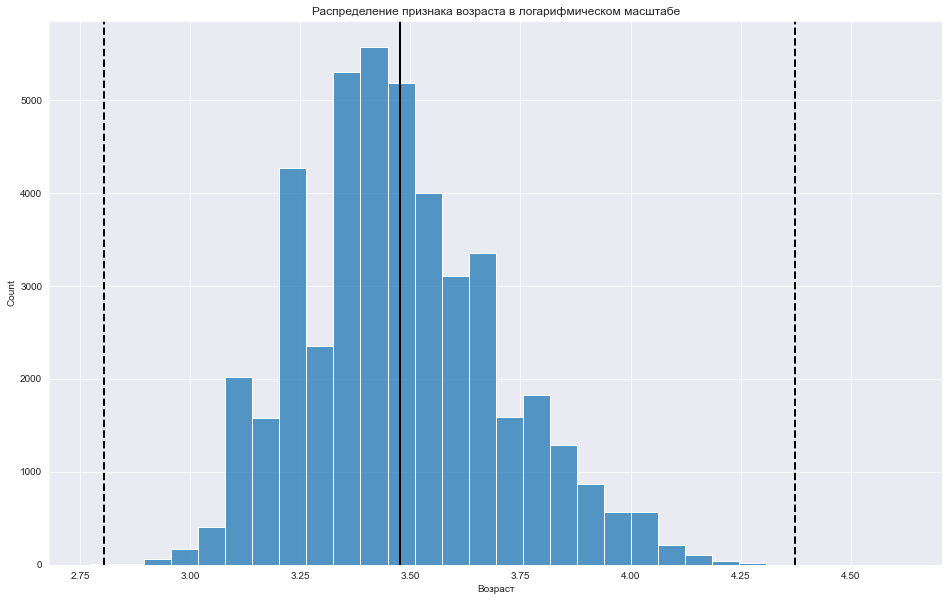

In [364]:
g, ax = plt.subplots(1, 1, figsize=(16, 10))

log_age = np.log(ds['Возраст'] + 1) # логарифмирование признака

histplot = sns.histplot(log_age,  bins=30, ax=ax) # гистограмма

histplot.set_title('Распределение признака возраста в логарифмическом масштабе')

histplot.axvline(log_age.mean(), color='k', lw=2) # среднее

# границы
histplot.axvline(log_age.mean()+ 4 *log_age.std(), color='k', ls='--', lw=2)
histplot.axvline(log_age.mean()- 3 *log_age.std(), color='k', ls='--', lw=2)

def outliers_z_score_mod(data, feature, left=3, right=3, log_scale=False):
    if log_scale:
        x = np.log(data[feature]+1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

# распределение имеет правостороннюю ассиметрию
outliers, ds = outliers_z_score_mod(ds, 'Возраст', left=3,  right=4, log_scale=True)
display(outliers.shape[0])

display(outliers['Возраст'])

Найденны с помощью метода z-отклонения выбросы: 2 значения в 15 лет и одно значение 100 лет.